In [ ]:
!curl -s https://packagecloud.io/install/repositories/github/git-lfs/script.deb.sh | bash
!apt-get install git-lfs
!git lfs install
!git clone https://huggingface.co/datasets/LeoFeng/MLHW_6
!unzip ./MLHW_6/faces.zip -d .

流式输出内容被截断，只能显示最后 5000 行内容。
  inflating: ./faces/20071.jpg       
  inflating: ./faces/26595.jpg       
  inflating: ./faces/49584.jpg       
  inflating: ./faces/43981.jpg       
  inflating: ./faces/10666.jpg       
  inflating: ./faces/58463.jpg       
  inflating: ./faces/16295.jpg       
  inflating: ./faces/21060.jpg       
  inflating: ./faces/4403.jpg        
  inflating: ./faces/16084.jpg       
  inflating: ./faces/65220.jpg       
  inflating: ./faces/45567.jpg       
  inflating: ./faces/63132.jpg       
  inflating: ./faces/67431.jpg       
  inflating: ./faces/29426.jpg       
  inflating: ./faces/71111.jpg       
  inflating: ./faces/21515.jpg       
  inflating: ./faces/60713.jpg       
  inflating: ./faces/69169.jpg       
  inflating: ./faces/47845.jpg       
  inflating: ./faces/67653.jpg       
  inflating: ./faces/46503.jpg       
  inflating: ./faces/52996.jpg       
  inflating: ./faces/62068.jpg       
  inflating: ./faces/36319.jpg       
  inflating: ./faces/35

In [ ]:
import os
import glob
import random
from datetime import datetime

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch import optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader

import matplotlib.pyplot as plt
import numpy as np
import logging
from tqdm import tqdm


# seed setting
def same_seeds(seed):
    # Python built-in random module
    random.seed(seed)
    # Numpy
    np.random.seed(seed)
    # Torch
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

same_seeds(2022)
workspace_dir = '.'

In [ ]:
# prepare for CrypkoDataset

class CrypkoDataset(Dataset):
    def __init__(self, fnames, transform):
        self.transform = transform
        self.fnames = fnames
        self.num_samples = len(self.fnames)

    def __getitem__(self,idx):
        fname = self.fnames[idx]
        img = torchvision.io.read_image(fname)
        img = self.transform(img)
        return img

    def __len__(self):
        return self.num_samples

def get_dataset(root):
    fnames = glob.glob(os.path.join(root, '*'))
    compose = [
        transforms.ToPILImage(),
        transforms.Resize((64, 64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ]
    transform = transforms.Compose(compose)
    dataset = CrypkoDataset(fnames, transform)
    return dataset

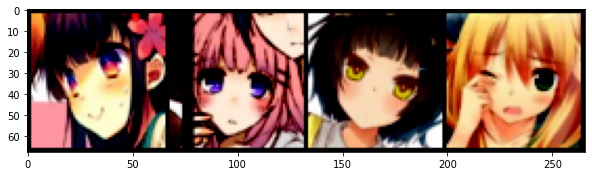

In [ ]:
temp_dataset = get_dataset(os.path.join(workspace_dir, 'faces'))

images = [temp_dataset[i] for i in range(4)]
grid_img = torchvision.utils.make_grid(images, nrow=4)
plt.figure(figsize=(10,10))
plt.imshow(grid_img.permute(1, 2, 0))
plt.show()

In [ ]:
# Generator

class Generator(nn.Module):
    """
    Input shape: (batch, in_dim)
    Output shape: (batch, 3, 64, 64)
    """
    def __init__(self, in_dim, feature_dim=64):
        super().__init__()
    
        #input: (batch, 100)
        self.l1 = nn.Sequential(
            nn.Linear(in_dim, feature_dim * 8 * 4 * 4, bias=False),
            nn.BatchNorm1d(feature_dim * 8 * 4 * 4),
            nn.ReLU()
        )
        self.l2 = nn.Sequential(
            self.dconv_bn_relu(feature_dim * 8, feature_dim * 4),               #(batch, feature_dim * 16, 8, 8)     
            self.dconv_bn_relu(feature_dim * 4, feature_dim * 2),               #(batch, feature_dim * 16, 16, 16)     
            self.dconv_bn_relu(feature_dim * 2, feature_dim),                   #(batch, feature_dim * 16, 32, 32)     
        )
        self.l3 = nn.Sequential(
            nn.ConvTranspose2d(feature_dim, 3, kernel_size=5, stride=2,
                               padding=2, output_padding=1, bias=False),
            nn.Tanh()   
        )
        self.apply(weights_init)
    def dconv_bn_relu(self, in_dim, out_dim):
        return nn.Sequential(
            nn.ConvTranspose2d(in_dim, out_dim, kernel_size=5, stride=2,
                               padding=2, output_padding=1, bias=False),        #double height and width
            nn.BatchNorm2d(out_dim),
            nn.ReLU(True)
        )
    def forward(self, x):
        y = self.l1(x)
        y = y.view(y.size(0), -1, 4, 4)
        y = self.l2(y)
        y = self.l3(y)
        return y

In [ ]:
# Discriminator
class Discriminator(nn.Module):
    """
    Input shape: (batch, 3, 64, 64)
    Output shape: (batch)
    """
    def __init__(self, in_dim, feature_dim=64):
        super(Discriminator, self).__init__()
            
        #input: (batch, 3, 64, 64)

        self.l1 = nn.Sequential(
            nn.Conv2d(in_dim, feature_dim, kernel_size=4, stride=2, padding=1), #(batch, 3, 32, 32)
            nn.LeakyReLU(0.2),
            self.conv_bn_lrelu(feature_dim, feature_dim * 2),                   #(batch, 3, 16, 16)
            self.conv_bn_lrelu(feature_dim * 2, feature_dim * 4),               #(batch, 3, 8, 8)
            self.conv_bn_lrelu(feature_dim * 4, feature_dim * 8),               #(batch, 3, 4, 4)
            nn.Conv2d(feature_dim * 8, 1, kernel_size=4, stride=1, padding=0),
            nn.Sigmoid() 
        )
        self.apply(weights_init)
    def conv_bn_lrelu(self, in_dim, out_dim):
   

        return nn.Sequential(
            nn.Conv2d(in_dim, out_dim, 4, 2, 1),
            nn.BatchNorm2d(out_dim),
            nn.LeakyReLU(0.2),
        )
    def forward(self, x):
        y = self.l1(x)
        y = y.view(-1)
        return y

In [ ]:
# setting for weight init function
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [ ]:
class TrainerGAN():
    def __init__(self, config):
        self.config = config
        
        self.G = Generator(100)
        self.D = Discriminator(3)
        
        self.loss = nn.BCELoss()

        
        self.opt_D = torch.optim.Adam(self.D.parameters(), lr=self.config["lr"], betas=(0.5, 0.999))
        self.opt_G = torch.optim.Adam(self.G.parameters(), lr=self.config["lr"], betas=(0.5, 0.999))
        
        self.dataloader = None
        self.log_dir = os.path.join(self.config["workspace_dir"], 'logs')
        self.ckpt_dir = os.path.join(self.config["workspace_dir"], 'checkpoints')
        
        FORMAT = '%(asctime)s - %(levelname)s: %(message)s'
        logging.basicConfig(level=logging.INFO, 
                            format=FORMAT,
                            datefmt='%Y-%m-%d %H:%M')
        
        self.steps = 0
        self.z_samples = Variable(torch.randn(100, self.config["z_dim"])).cuda()
        
    def prepare_environment(self):
      
        os.makedirs(self.log_dir, exist_ok=True)
        os.makedirs(self.ckpt_dir, exist_ok=True)
        
        # update dir by time
        time = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
        self.log_dir = os.path.join(self.log_dir, time+f'_{self.config["model_type"]}')
        self.ckpt_dir = os.path.join(self.ckpt_dir, time+f'_{self.config["model_type"]}')
        os.makedirs(self.log_dir)
        os.makedirs(self.ckpt_dir)
        
        # create dataset by the above function
        dataset = get_dataset(os.path.join(self.config["workspace_dir"], 'faces'))
        self.dataloader = DataLoader(dataset, batch_size=self.config["batch_size"], shuffle=True, num_workers=2)
        
        # model preparation
        self.G = self.G.cuda()
        self.D = self.D.cuda()
        self.G.train()
        self.D.train()
    def gp(self):
       
        pass
        
    def train(self):
       
        self.prepare_environment()
        
        for e, epoch in enumerate(range(self.config["n_epoch"])):
            progress_bar = tqdm(self.dataloader)
            progress_bar.set_description(f"Epoch {e+1}")
            for i, data in enumerate(progress_bar):
                imgs = data.cuda()
                bs = imgs.size(0)

                # *********************
                # *    Train D        *
                # *********************
                z = Variable(torch.randn(bs, self.config["z_dim"])).cuda()
                r_imgs = Variable(imgs).cuda()
                f_imgs = self.G(z)
                r_label = torch.ones((bs)).cuda()
                f_label = torch.zeros((bs)).cuda()


                # Discriminator forwarding
                r_logit = self.D(r_imgs)
                f_logit = self.D(f_imgs)

               
                # Loss for discriminator
                r_loss = self.loss(r_logit, r_label)
                f_loss = self.loss(f_logit, f_label)
                loss_D = (r_loss + f_loss) / 2

                # Discriminator backwarding
                self.D.zero_grad()
                loss_D.backward()
                self.opt_D.step()

               
                # for p in self.D.parameters():
                #     p.data.clamp_(-self.config["clip_value"], self.config["clip_value"])



                # *********************
                # *    Train G        *
                # *********************
                if self.steps % self.config["n_critic"] == 0:
                    # Generate some fake images.
                    z = Variable(torch.randn(bs, self.config["z_dim"])).cuda()
                    f_imgs = self.G(z)

                    # Generator forwarding
                    f_logit = self.D(f_imgs)


                
                    # Loss for the generator.
                    loss_G = self.loss(f_logit, r_label)

                    # Generator backwarding
                    self.G.zero_grad()
                    loss_G.backward()
                    self.opt_G.step()
                    
                if self.steps % 10 == 0:
                    progress_bar.set_postfix(loss_G=loss_G.item(), loss_D=loss_D.item())
                self.steps += 1

            self.G.eval()
            f_imgs_sample = (self.G(self.z_samples).data + 1) / 2.0
            filename = os.path.join(self.log_dir, f'Epoch_{epoch+1:03d}.jpg')
            torchvision.utils.save_image(f_imgs_sample, filename, nrow=10)
            logging.info(f'Save some samples to {filename}.')

            # Show some images during training.
            grid_img = torchvision.utils.make_grid(f_imgs_sample.cpu(), nrow=10)
            plt.figure(figsize=(10,10))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.show()

            self.G.train()

            if (e+1) % 5 == 0 or e == 0:
                # Save the checkpoints.
                torch.save(self.G.state_dict(), os.path.join(self.ckpt_dir, f'G_{e}.pth'))
                torch.save(self.D.state_dict(), os.path.join(self.ckpt_dir, f'D_{e}.pth'))

        logging.info('Finish training')

    def inference(self, G_path, n_generate=1000, n_output=30, show=False):
      

        self.G.load_state_dict(torch.load(G_path))
        self.G.cuda()
        self.G.eval()
        z = Variable(torch.randn(n_generate, self.config["z_dim"])).cuda()
        imgs = (self.G(z).data + 1) / 2.0
        
        os.makedirs('output', exist_ok=True)
        for i in range(n_generate):
            torchvision.utils.save_image(imgs[i], f'output/{i+1}.jpg')
        
        if show:
            row, col = n_output//10 + 1, 10
            grid_img = torchvision.utils.make_grid(imgs[:n_output].cpu(), nrow=row)
            plt.figure(figsize=(row, col))
            plt.imshow(grid_img.permute(1, 2, 0))
            plt.show()

In [ ]:
config = {
    "model_type": "GAN",
    "batch_size": 64,
    "lr": 1e-4,
    "n_epoch": 20,
    "n_critic": 1,
    "z_dim": 100,
    "workspace_dir": workspace_dir, # define in the environment setting
}

Epoch 1: 100%|██████████| 1115/1115 [02:38<00:00,  7.06it/s, loss_D=0.154, loss_G=7.96]


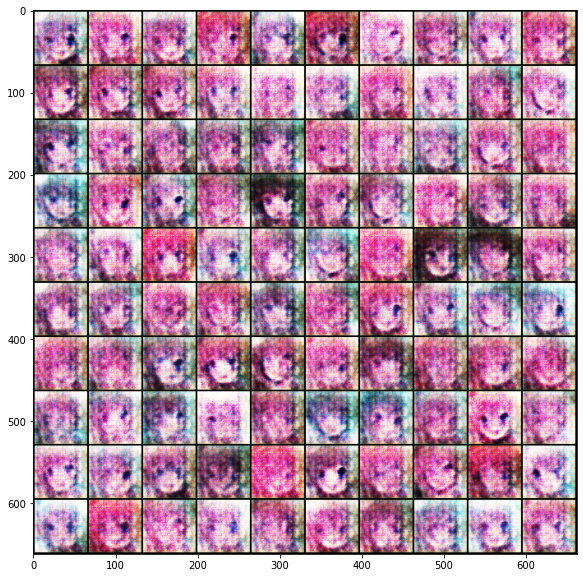

Epoch 2: 100%|██████████| 1115/1115 [02:38<00:00,  7.05it/s, loss_D=0.145, loss_G=3.69]


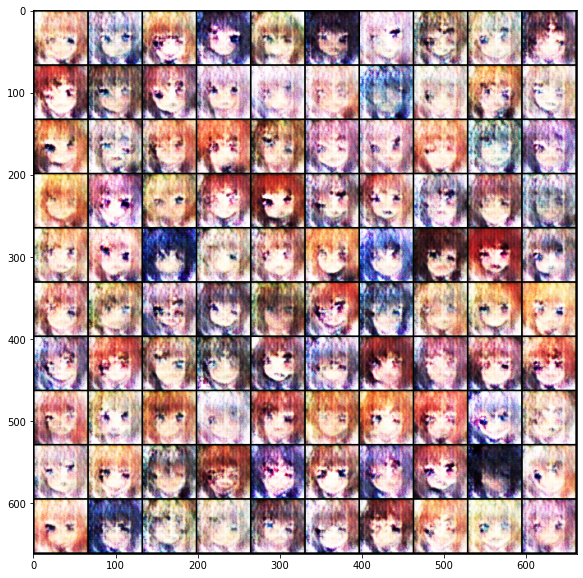

Epoch 3: 100%|██████████| 1115/1115 [02:38<00:00,  7.05it/s, loss_D=0.142, loss_G=4.37]


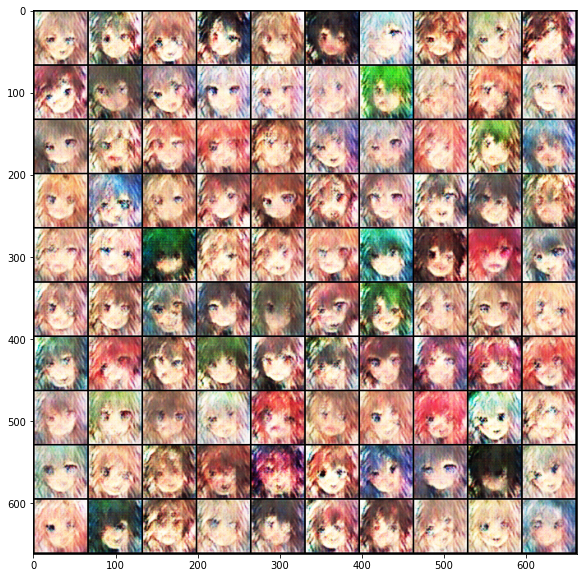

Epoch 4: 100%|██████████| 1115/1115 [02:37<00:00,  7.07it/s, loss_D=0.212, loss_G=6.02]


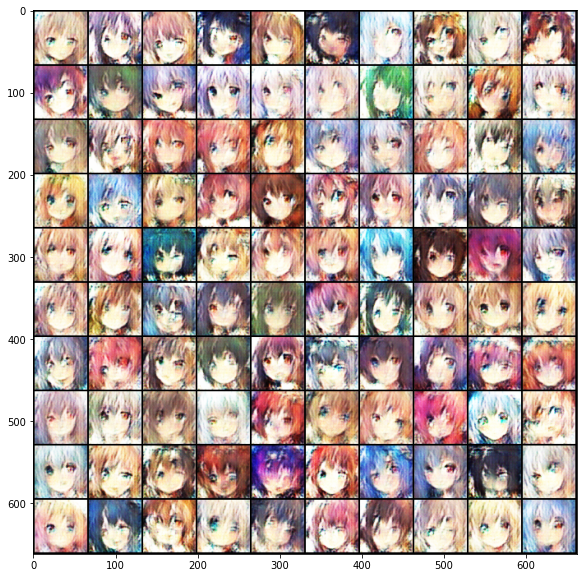

Epoch 5: 100%|██████████| 1115/1115 [02:38<00:00,  7.05it/s, loss_D=0.517, loss_G=1.93]


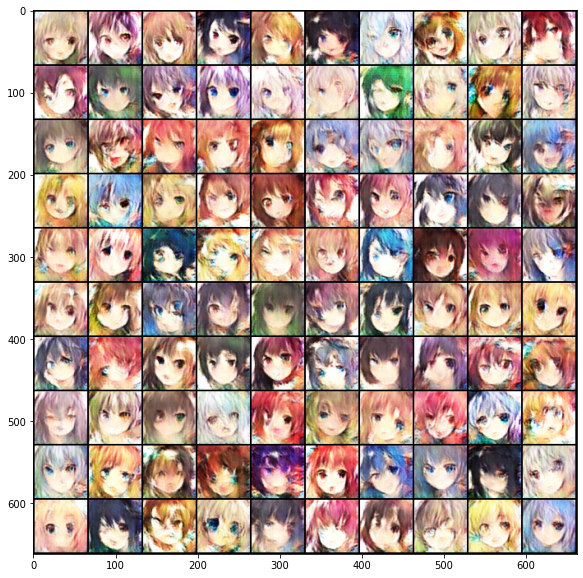

Epoch 6: 100%|██████████| 1115/1115 [02:38<00:00,  7.04it/s, loss_D=0.0942, loss_G=4.54]


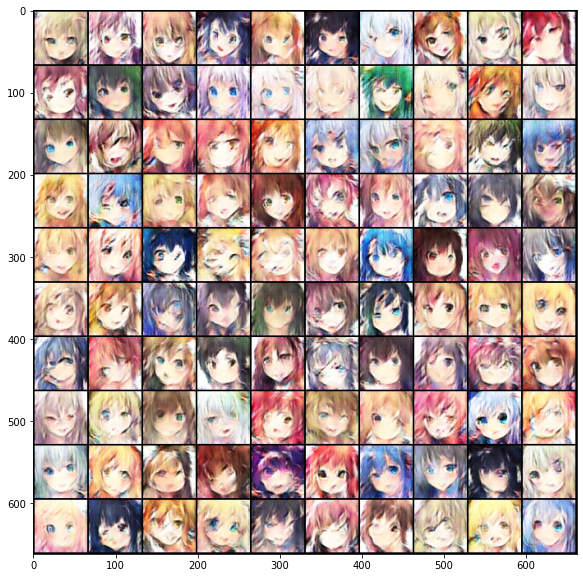

Epoch 7: 100%|██████████| 1115/1115 [02:38<00:00,  7.03it/s, loss_D=0.0797, loss_G=4.58]


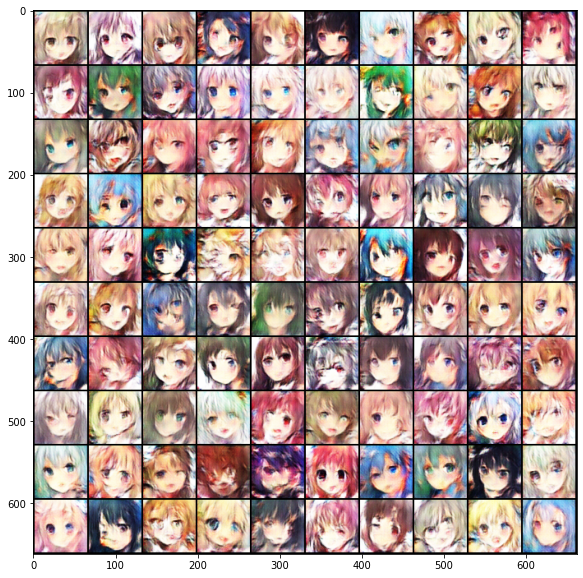

Epoch 8: 100%|██████████| 1115/1115 [02:38<00:00,  7.02it/s, loss_D=0.0996, loss_G=3.6]


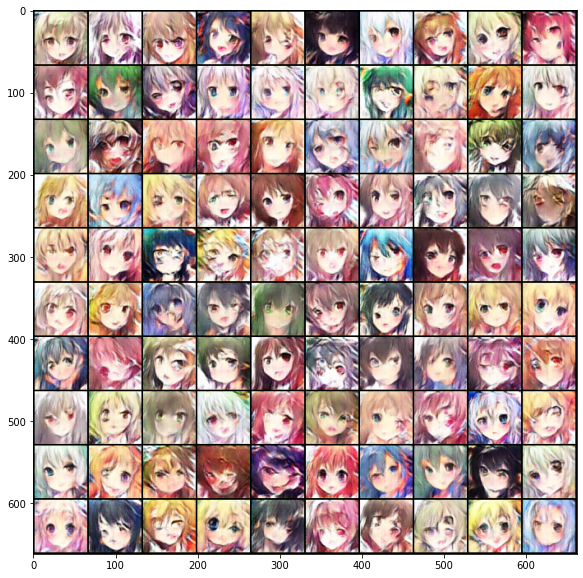

Epoch 9: 100%|██████████| 1115/1115 [02:39<00:00,  7.01it/s, loss_D=0.116, loss_G=3.72]


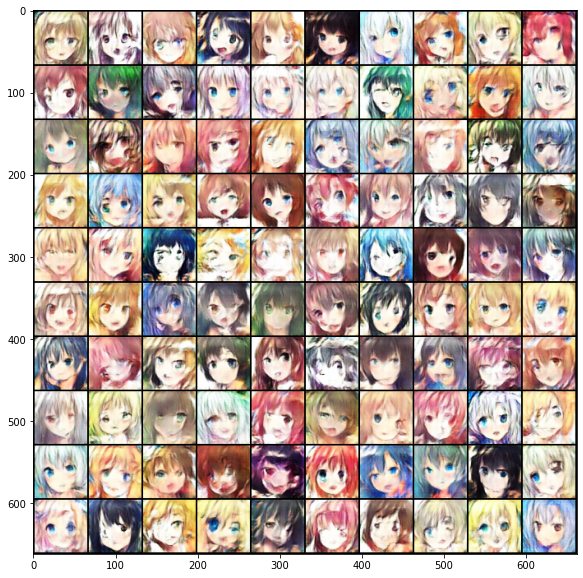

Epoch 10: 100%|██████████| 1115/1115 [02:39<00:00,  6.99it/s, loss_D=0.221, loss_G=7.32]


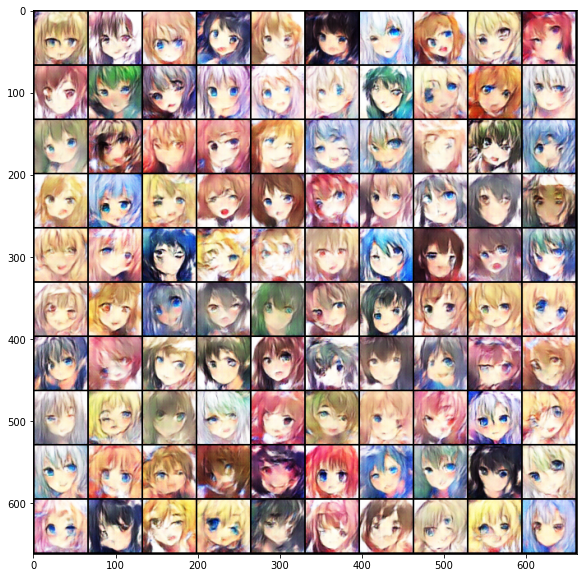

Epoch 11: 100%|██████████| 1115/1115 [02:39<00:00,  6.98it/s, loss_D=0.66, loss_G=10]


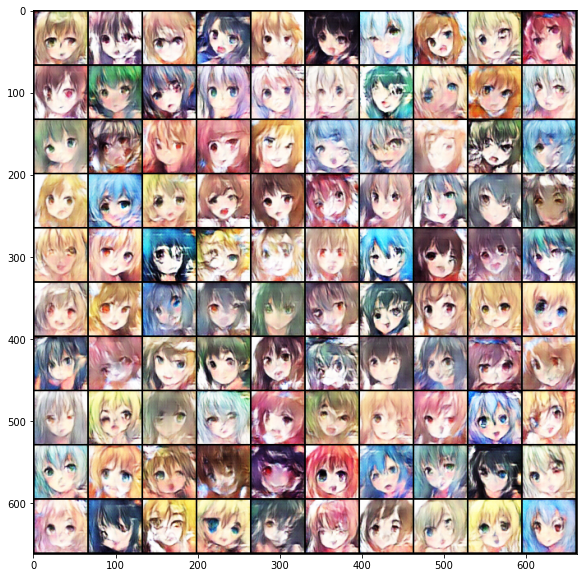

Epoch 12: 100%|██████████| 1115/1115 [02:39<00:00,  6.97it/s, loss_D=0.205, loss_G=5.76]


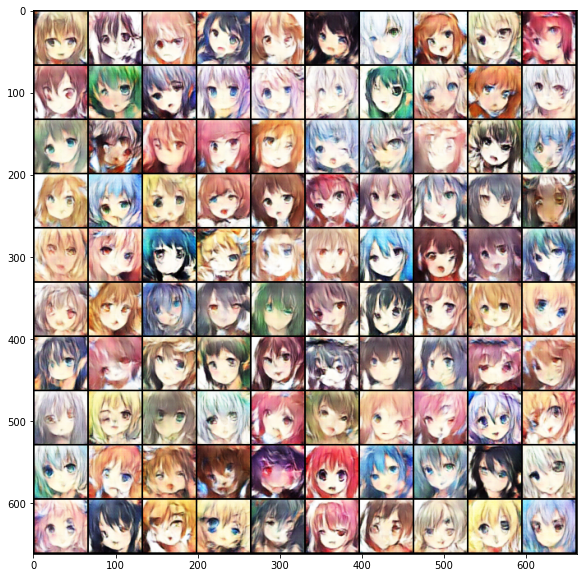

Epoch 13: 100%|██████████| 1115/1115 [02:39<00:00,  6.97it/s, loss_D=0.0652, loss_G=4.28]


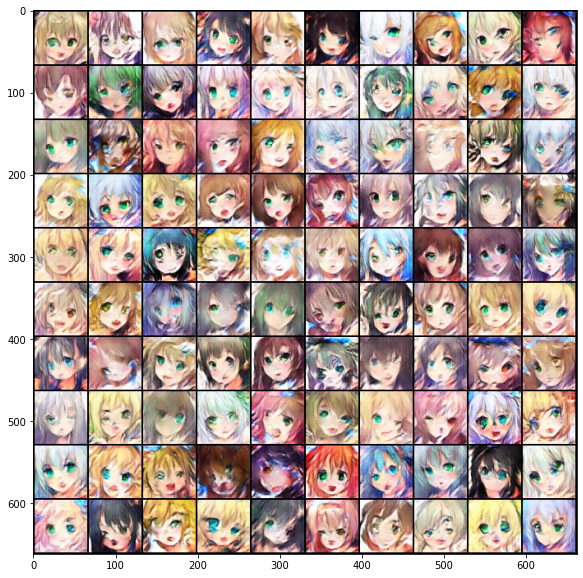

Epoch 14: 100%|██████████| 1115/1115 [02:40<00:00,  6.96it/s, loss_D=0.217, loss_G=4.2]


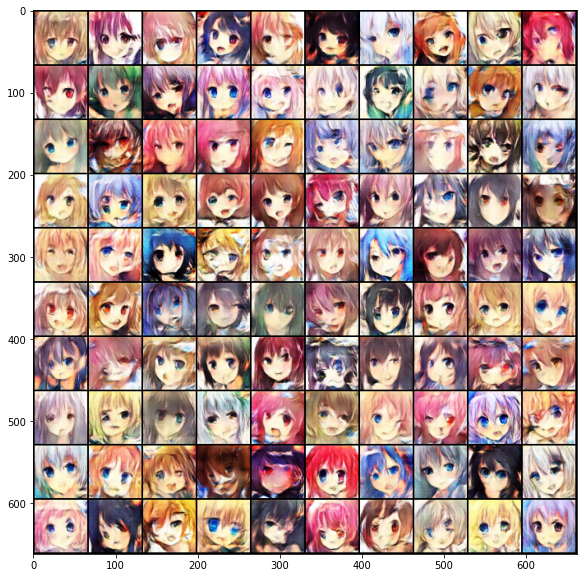

Epoch 15: 100%|██████████| 1115/1115 [02:40<00:00,  6.95it/s, loss_D=6.62e-6, loss_G=41.3]


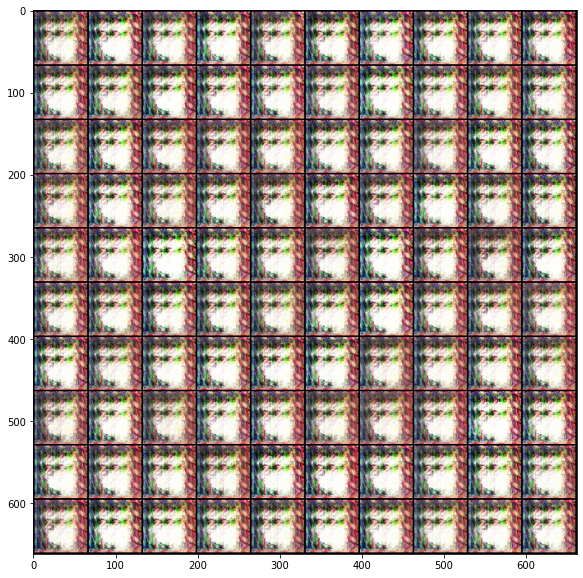

Epoch 16: 100%|██████████| 1115/1115 [02:40<00:00,  6.96it/s, loss_D=0.00845, loss_G=7.83]


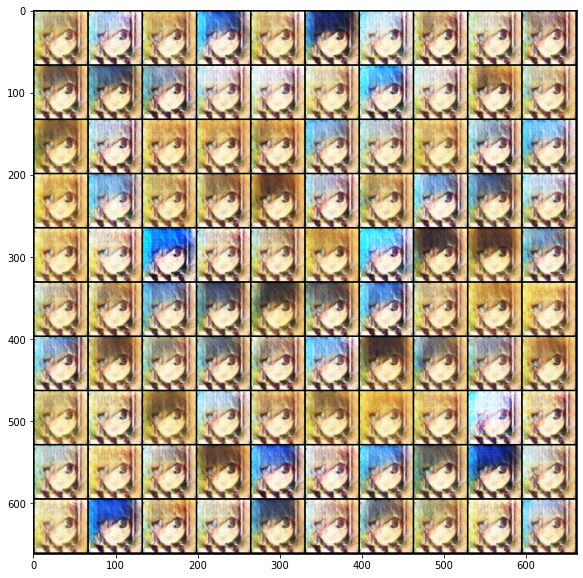

Epoch 17: 100%|██████████| 1115/1115 [02:40<00:00,  6.96it/s, loss_D=0.0079, loss_G=13]


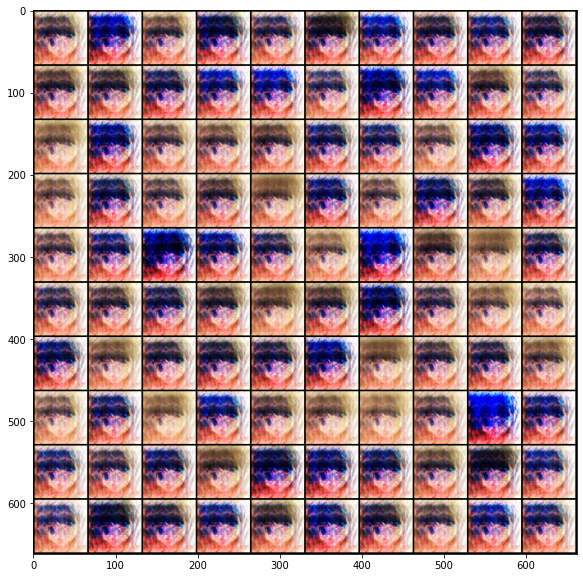

Epoch 18: 100%|██████████| 1115/1115 [02:39<00:00,  6.97it/s, loss_D=0.00288, loss_G=5.96]


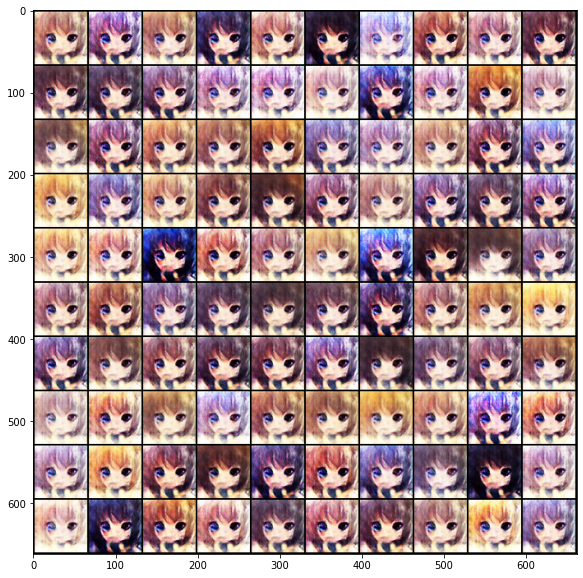

Epoch 19: 100%|██████████| 1115/1115 [02:40<00:00,  6.96it/s, loss_D=0.00356, loss_G=11.8]


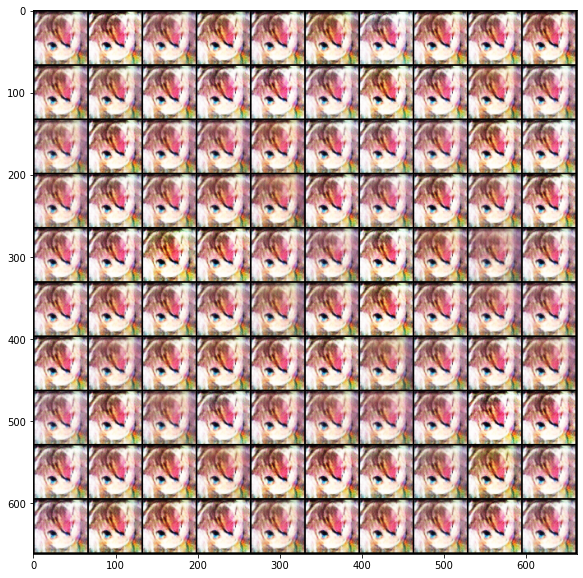

Epoch 20: 100%|██████████| 1115/1115 [02:40<00:00,  6.96it/s, loss_D=0.0329, loss_G=8.18]


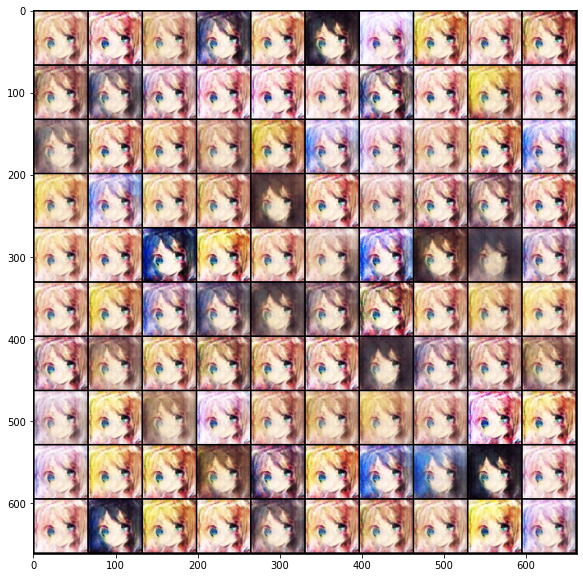

In [ ]:
trainer = TrainerGAN(config)
trainer.train()